# Lab 3: XOR using ANN

**Done By:**
- Name: Sudip Parajuli
- Roll: PUR077BEI041
- Faculty: BEI

**Submitted To:**
- Name: Pukar Karki
- Department of Electronics and Computer Engineering 
- IOE Purwanchal Campus, Dharan

## XOR Gate Implementation Using ANN

Initial hidden weights: [0.34818624 0.22523781] [0.80442862 0.90670426]
Initial hidden biases: [0.92532527 0.91521793]
Initial output weights: [0.49680652] [0.80034381]
Initial output biases: [0.7931037]
Final hidden weights: [3.4154109  5.75229335] [3.46883764 6.10426223]
Final hidden bias: [-5.24576434 -2.39285069]
Final output weights: [-7.86456221] [7.20701995]
Final output bias: [-3.19998138]

Output from neural network after 10,000 epochs: [0.06675069] [0.93685281] [0.93571395] [0.07053004]


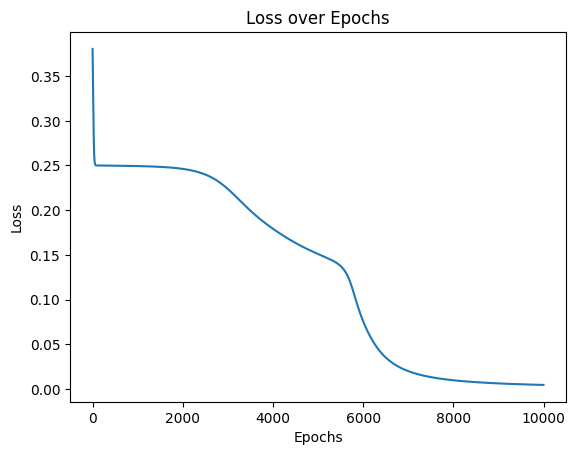

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def sigmoid_derivative(x):
    return x * (1 - x)

# Input datasets
inputs = np.array([[0, 0], [0, 1], [1, 0], [1, 1]])
expected_output = np.array([[0], [1], [1], [0]])

epochs = 10000
lr = 0.1
inputLayerNeurons, hiddenLayerNeurons, outputLayerNeurons = 2, 2, 1

# Random weights and bias initialization
hidden_weights = np.random.uniform(size=(inputLayerNeurons, hiddenLayerNeurons))
hidden_bias = np.random.uniform(size=(1, hiddenLayerNeurons))
output_weights = np.random.uniform(size=(hiddenLayerNeurons, outputLayerNeurons))
output_bias = np.random.uniform(size=(1, outputLayerNeurons))

print("Initial hidden weights: ", end='')
print(*hidden_weights)
print("Initial hidden biases: ", end='')
print(*hidden_bias)
print("Initial output weights: ", end='')
print(*output_weights)
print("Initial output biases: ", end='')
print(*output_bias)

# List to store loss at each epoch
losses = []

# Training algorithm
for epoch in range(epochs):
    # Forward Propagation
    hidden_layer_activation = np.dot(inputs, hidden_weights)
    hidden_layer_activation += hidden_bias
    hidden_layer_output = sigmoid(hidden_layer_activation)

    output_layer_activation = np.dot(hidden_layer_output, output_weights)
    output_layer_activation += output_bias
    predicted_output = sigmoid(output_layer_activation)

    # Backpropagation
    error = expected_output - predicted_output
    d_predicted_output = error * sigmoid_derivative(predicted_output)

    error_hidden_layer = d_predicted_output.dot(output_weights.T)
    d_hidden_layer = error_hidden_layer * sigmoid_derivative(hidden_layer_output)

    # Updating Weights and Biases
    output_weights += hidden_layer_output.T.dot(d_predicted_output) * lr
    output_bias += np.sum(d_predicted_output, axis=0, keepdims=True) * lr
    hidden_weights += inputs.T.dot(d_hidden_layer) * lr
    hidden_bias += np.sum(d_hidden_layer, axis=0, keepdims=True) * lr

    # Calculate and store the loss
    loss = np.mean(np.square(error))
    losses.append(loss)

print("Final hidden weights: ", end='')
print(*hidden_weights)
print("Final hidden bias: ", end='')
print(*hidden_bias)
print("Final output weights: ", end='')
print(*output_weights)
print("Final output bias: ", end='')
print(*output_bias)

print("\nOutput from neural network after 10,000 epochs: ", end='')
print(*predicted_output)

# Plot the loss over epochs
plt.plot(range(epochs), losses)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss over Epochs')
plt.show()

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [7]:
# These are XOR inputs
x=np.array([[0,0,1,1],[0,1,0,1]])
# These are XOR outputs
y=np.array([[0,1,1,0]])
# Number of inputs
n_x = 2
# Number of neurns in output layer
n_y = 1
# Number of neurons in hidden layer
n_h = 2
# Total training examples
m = x.shape[1]
# Learning rate
lr = 0.1
# Define random seed for consistent results
np.random.seed(2)
# Define weight matrices for neural network
w1 = np.random.rand(n_h,n_x) 
print(w1)  # Weight matrix for hidden layer
w2 = np.random.rand(n_y,n_h)   # Weight matrix for output layer
# I didnt use bias units
# We will use this list to accumulate losses
losses = []

[[0.4359949  0.02592623]
 [0.54966248 0.43532239]]


In [3]:
# I used sigmoid activation function for hidden layer and output
def sigmoid(z):
    z= 1/(1+np.exp(-z))
    return z

# Forward propagation
def forward_prop(w1,w2,x):
    z1 = np.dot(w1,x)
    print(f"z1 is ", z1)
    a1 = sigmoid(z1)    
    z2 = np.dot(w2,a1)
    a2 = sigmoid(z2)
    return z1,a1,z2,a2

# Backward propagation
def back_prop(m,w1,w2,z1,a1,z2,a2,y):
    #computing the error at the output layer dz2
    dz2 = a2-y #a2 is the predicted output, y is true label
    #computing the gradient of the loss wrt w2(dw2)
    dw2 = np.dot(dz2,a1.T)/m
    #computing the error at the hidden layer dz1
    dz1 = np.dot(w2.T,dz2) * a1*(1-a1)
    #computing the gradient of the loss wrt w1(dw1)
    dw1 = np.dot(dz1,x.T)/m
    #reshaping the gradients
    dw1 = np.reshape(dw1,w1.shape)
    
    dw2 = np.reshape(dw2,w2.shape)    
    return dz2,dw2,dz1,dw1

z1 is  [[0.         0.02592623 0.4359949  0.46192113]
 [0.         0.43532239 0.54966248 0.98498487]]
z1 is  [[0.         0.02542171 0.43541176 0.46083347]
 [0.         0.43508947 0.5493848  0.98447426]]
z1 is  [[0.         0.0249335  0.43484639 0.45977989]
 [0.         0.43486754 0.54911925 0.98398679]]
z1 is  [[0.         0.02446108 0.43429825 0.45875933]
 [0.         0.43465619 0.54886539 0.98352158]]
z1 is  [[0.         0.02400396 0.4337668  0.45777077]
 [0.         0.434455   0.54862277 0.98307777]]
z1 is  [[0.         0.02356166 0.43325153 0.45681319]
 [0.         0.43426358 0.54839097 0.98265455]]
z1 is  [[0.         0.0231337  0.43275194 0.45588564]
 [0.         0.43408154 0.54816959 0.98225112]]
z1 is  [[0.         0.02271962 0.43226754 0.45498716]
 [0.         0.43390851 0.54795822 0.98186673]]
z1 is  [[0.         0.02231899 0.43179787 0.45411686]
 [0.         0.43374413 0.54775648 0.98150061]]
z1 is  [[0.         0.02193138 0.43134246 0.45327384]
 [0.         0.43358807 0.54

Text(0, 0.5, 'Loss value')

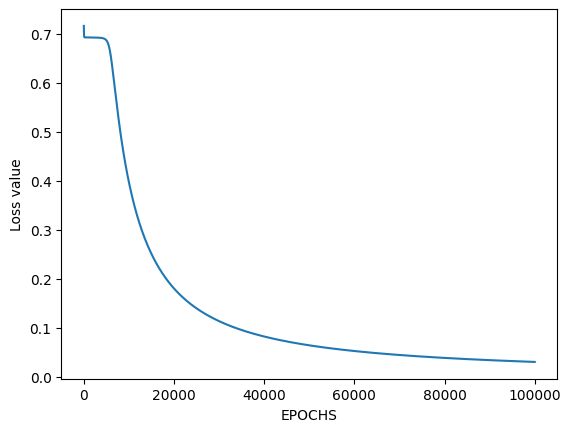

In [4]:
iterations = 100000
for i in range(iterations):
    z1,a1,z2,a2 = forward_prop(w1,w2,x)
    loss = -(1/m)*np.sum(y*np.log(a2)+(1-y)*np.log(1-a2))
    losses.append(loss)
    da2,dw2,dz1,dw1 = back_prop(m,w1,w2,z1,a1,z2,a2,y)
    w2 = w2-lr*dw2
    w1 = w1-lr*dw1

# We plot losses to see how our network is doing
plt.plot(losses)
plt.xlabel("EPOCHS")
plt.ylabel("Loss value")

In [5]:
def predict(w1,w2,input):
    z1,a1,z2,a2 = forward_prop(w1,w2,test)
    a2 = np.squeeze(a2)
    if a2>=0.5:
        print("For input", [i[0] for i in input], "output is 1")# ['{:.2f}'.format(i) for i in x])
    else:
        print("For input", [i[0] for i in input], "output is 0")

In [6]:
test = np.array([[0],[1]])
predict(w1,w2,test)

z1 is  [[0.89567747]
 [8.24974995]]
For input [np.int64(0), np.int64(1)] output is 1
